# EEG Data pre-processing pipeline 

In [151]:
#%matplotlib qt
%matplotlib inline

import matplotlib.pyplot as plt
import mne
import numpy as np
import pandas as pd

In [143]:
#raw = mne.io.read_raw_brainvision("..\data_EEG\group11_own.vhdr", preload=True)
raw = mne.io.read_raw_fif('..\data_EEG\group11_own_AH-raw.fif', preload=True)


Opening raw data file ..\data_EEG\group11_own_AH-raw.fif...
    Range : 8000000 ... 9000000 =   8000.000 ...  9000.000 secs
Ready.
Reading 0 ... 1000000  =      0.000 ...  1000.000 secs...


In [144]:
raw.info

Measurement date,"May 02, 2024 09:55:09 GMT"
Experimenter,Unknown
Participant,Unknown
Digitized points,35 points
Good channels,"32 EEG, 1 misc"
Bad channels,None
EOG channels,Not available
ECG channels,Not available
Sampling frequency,1000.00 Hz
Highpass,0.10 Hz
Lowpass,40.00 Hz


In [146]:
print(raw.info['ch_names'])


['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'FC5', 'FC1', 'FC2', 'FC6', 'T7', 'C3', 'Cz', 'C4', 'T8', 'TP9', 'CP5', 'CP1', 'CP2', 'CP6', 'TP10', 'P7', 'P3', 'Pz', 'P4', 'P8', 'PO9', 'O1', 'Oz', 'O2', 'PO10', '41']


In [147]:
# Specify EOG and Misc (diode) channels
#eog_channels = {'HEOG': 'eog', 'VEOG': 'eog'}  
misc_channels = {'41': 'misc'} 

# Set the channel types in the raw data
#raw.set_channel_types(eog_channels)
raw.set_channel_types(misc_channels)

Measurement date,"May 02, 2024 09:55:09 GMT"
Experimenter,Unknown
Participant,Unknown
Digitized points,35 points
Good channels,"32 EEG, 1 misc"
Bad channels,None
EOG channels,Not available
ECG channels,Not available
Sampling frequency,1000.00 Hz
Highpass,0.10 Hz
Lowpass,40.00 Hz


In [148]:
# Specify	the	channel	locations	using	Montage
montage = mne.channels.make_standard_montage('standard_1020')
raw.set_montage(montage, verbose=False)

Measurement date,"May 02, 2024 09:55:09 GMT"
Experimenter,Unknown
Participant,Unknown
Digitized points,35 points
Good channels,"32 EEG, 1 misc"
Bad channels,None
EOG channels,Not available
ECG channels,Not available
Sampling frequency,1000.00 Hz
Highpass,0.10 Hz
Lowpass,40.00 Hz


In [149]:
raw.set_eeg_reference('average', projection=False)

EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.


Measurement date,"May 02, 2024 09:55:09 GMT"
Experimenter,Unknown
Participant,Unknown
Digitized points,35 points
Good channels,"32 EEG, 1 misc"
Bad channels,None
EOG channels,Not available
ECG channels,Not available
Sampling frequency,1000.00 Hz
Highpass,0.10 Hz
Lowpass,40.00 Hz


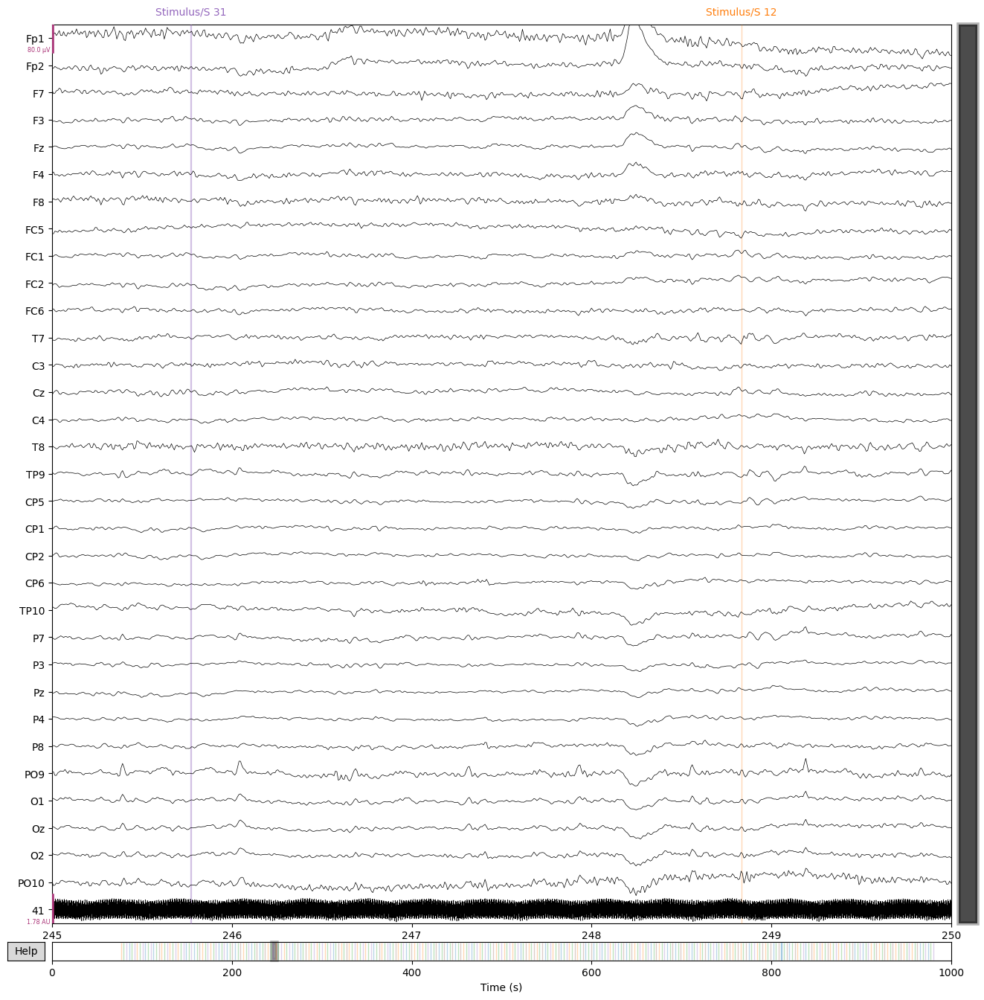

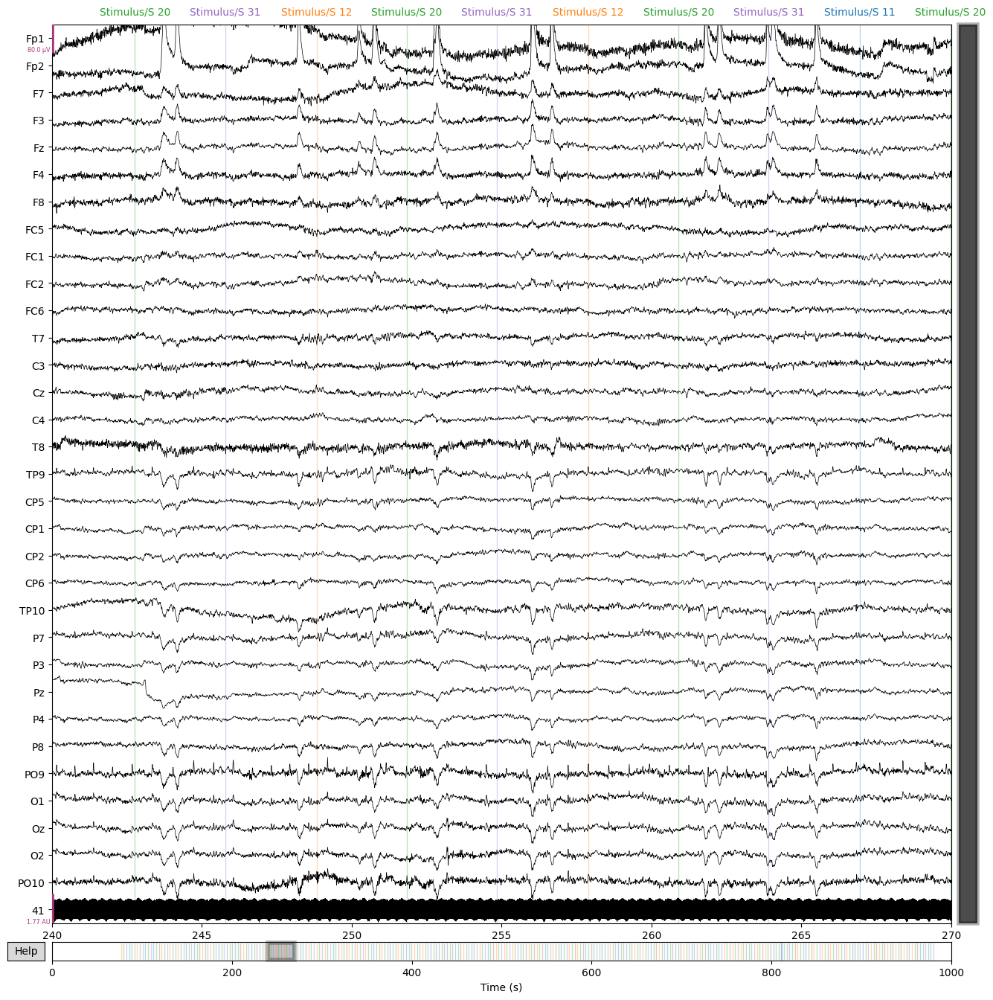

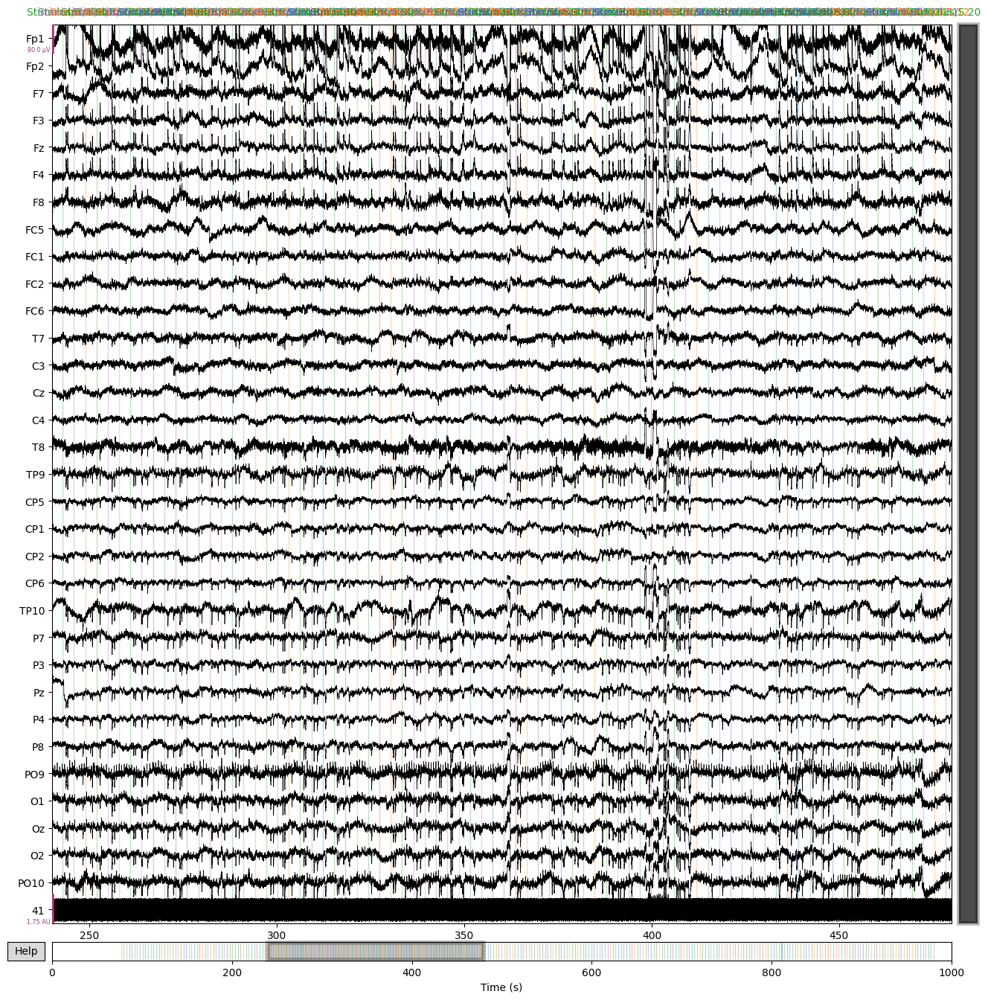

In [156]:
scalings = {'eeg': 40e-6, 'eog': 150e-6}  

raw_short_plot = raw.plot(n_channels=33, scalings=scalings, title='Raw EEG Data Short', start=245, duration=5, block=False)
raw_medium_plot = raw.plot(n_channels=33, scalings=scalings, title='Raw EEG Data Short', start=240, duration=30, block=False)
raw_long_plot = raw.plot(n_channels=33, scalings=scalings, title='Raw EEG Data Short', start=240, duration=240, block=False)


Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 49 - 51 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 49.38
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 49.12 Hz)
- Upper passband edge: 50.62 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 50.88 Hz)
- Filter length: 6601 samples (6.601 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.7s


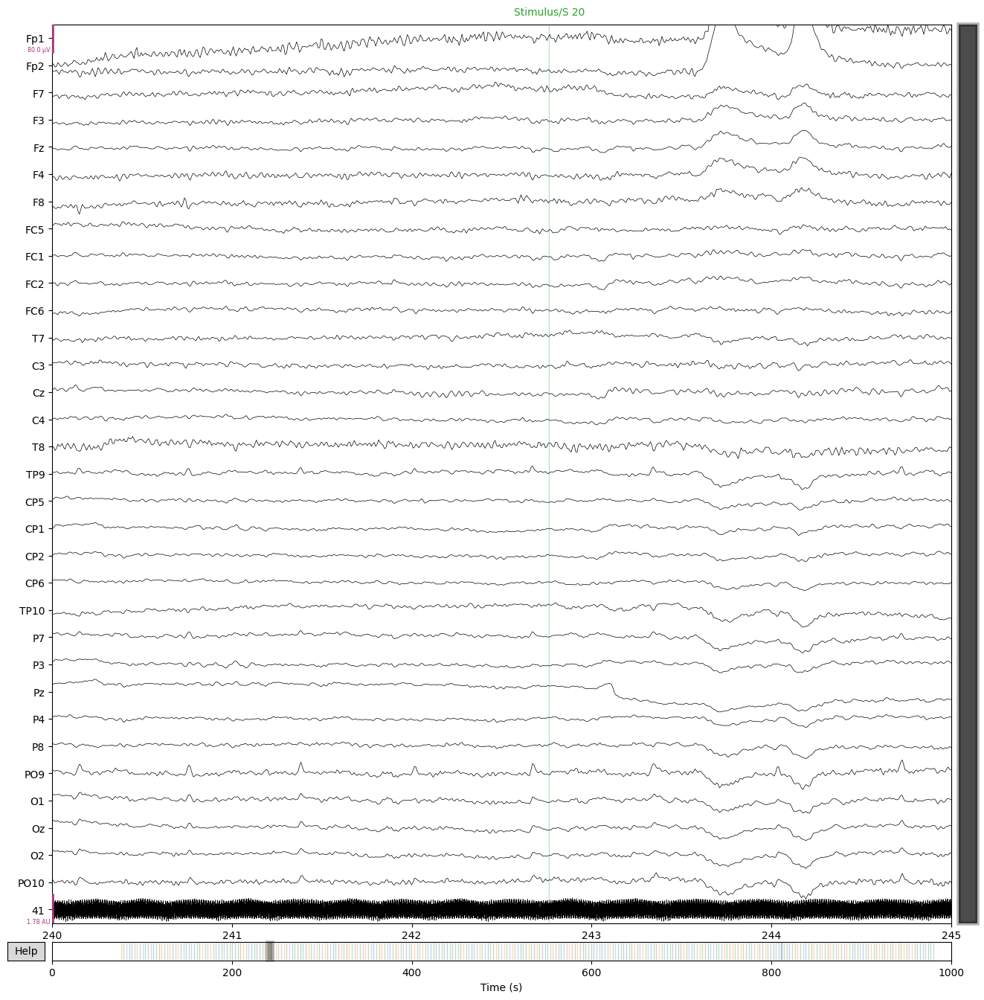

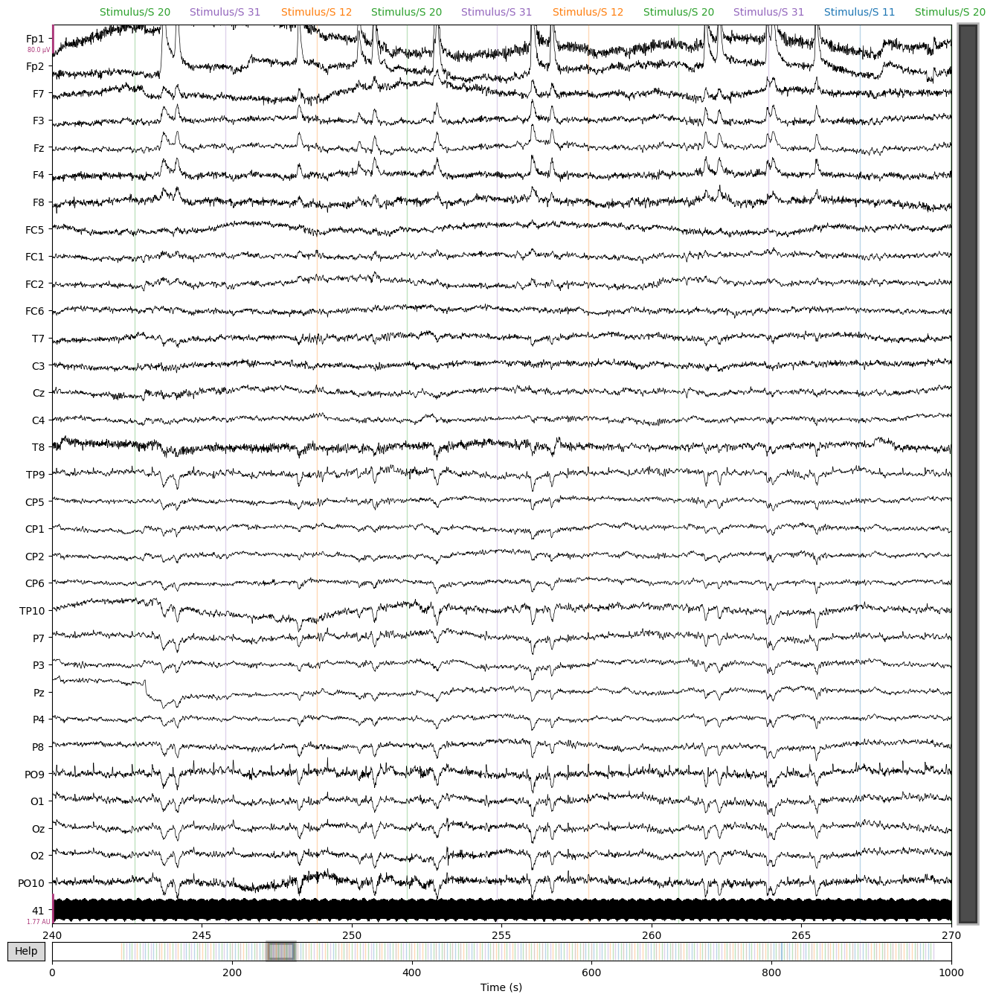

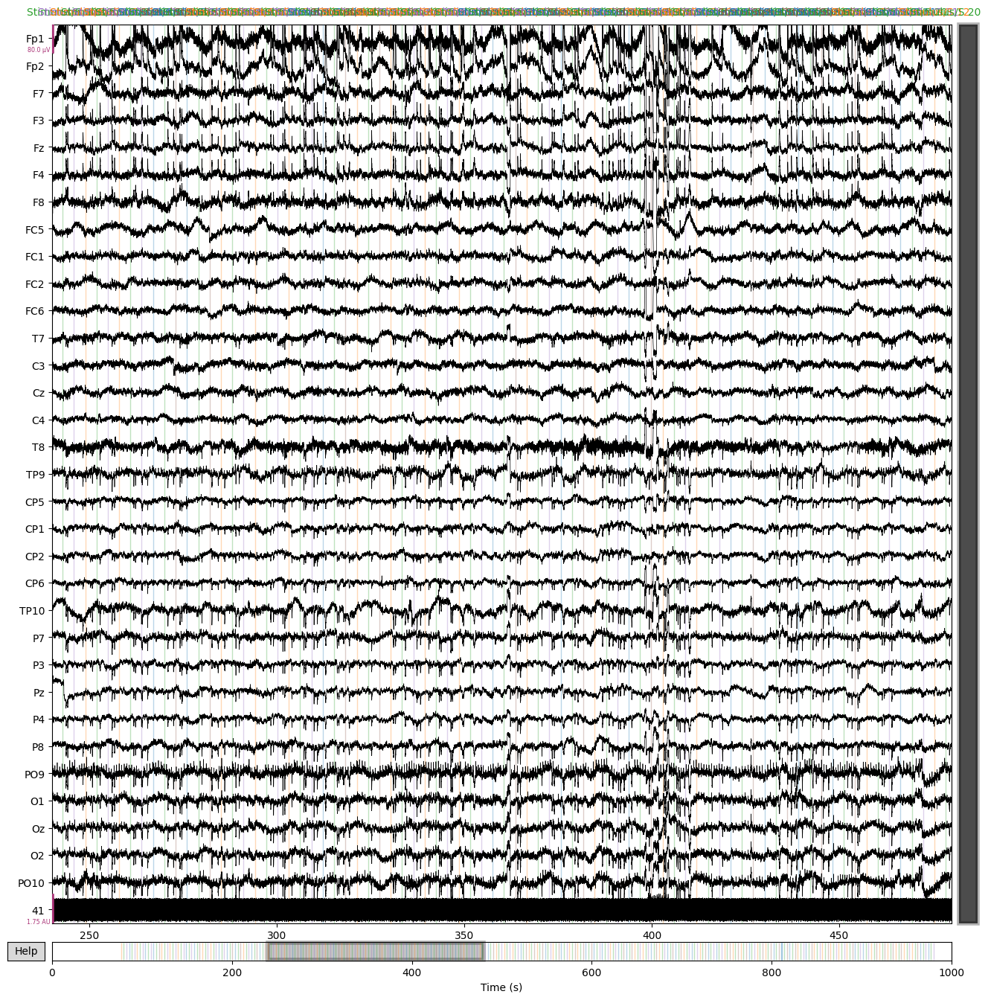

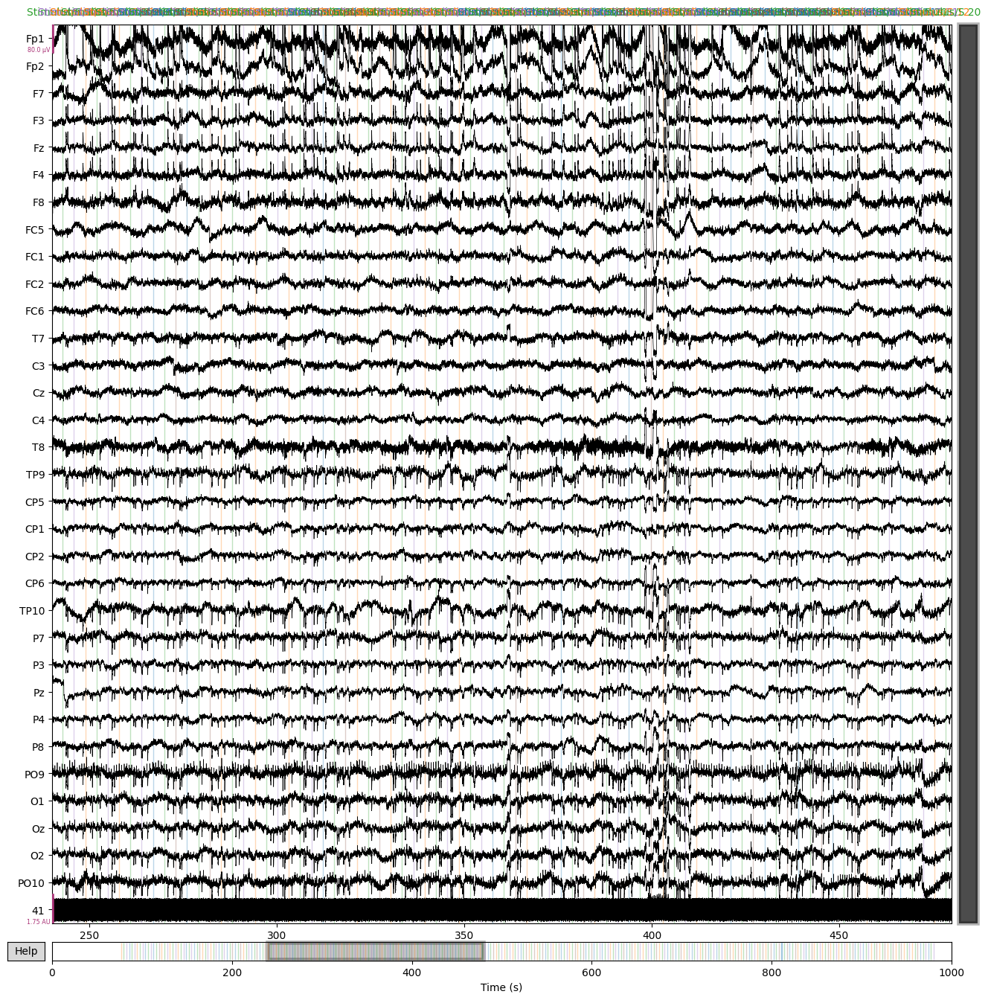

In [157]:
# Apply Notch Filter: 
notch_freq = 50 
raw.notch_filter(freqs=notch_freq, fir_design='firwin')

raw.plot(n_channels=33, scalings=scalings, title='Raw EEG Data Short', start=240, duration=5, block=True)
raw.plot(n_channels=33, scalings=scalings, title='Raw EEG Data Short', start=240, duration=30, block=True)
raw.plot(n_channels=33, scalings=scalings, title='Raw EEG Data Short', start=240, duration=240, block=True)


In [158]:
raw_filtered = raw.copy().filter(l_freq=0.1, h_freq=40, fir_design='firwin')

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 33001 samples (33.001 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    1.5s


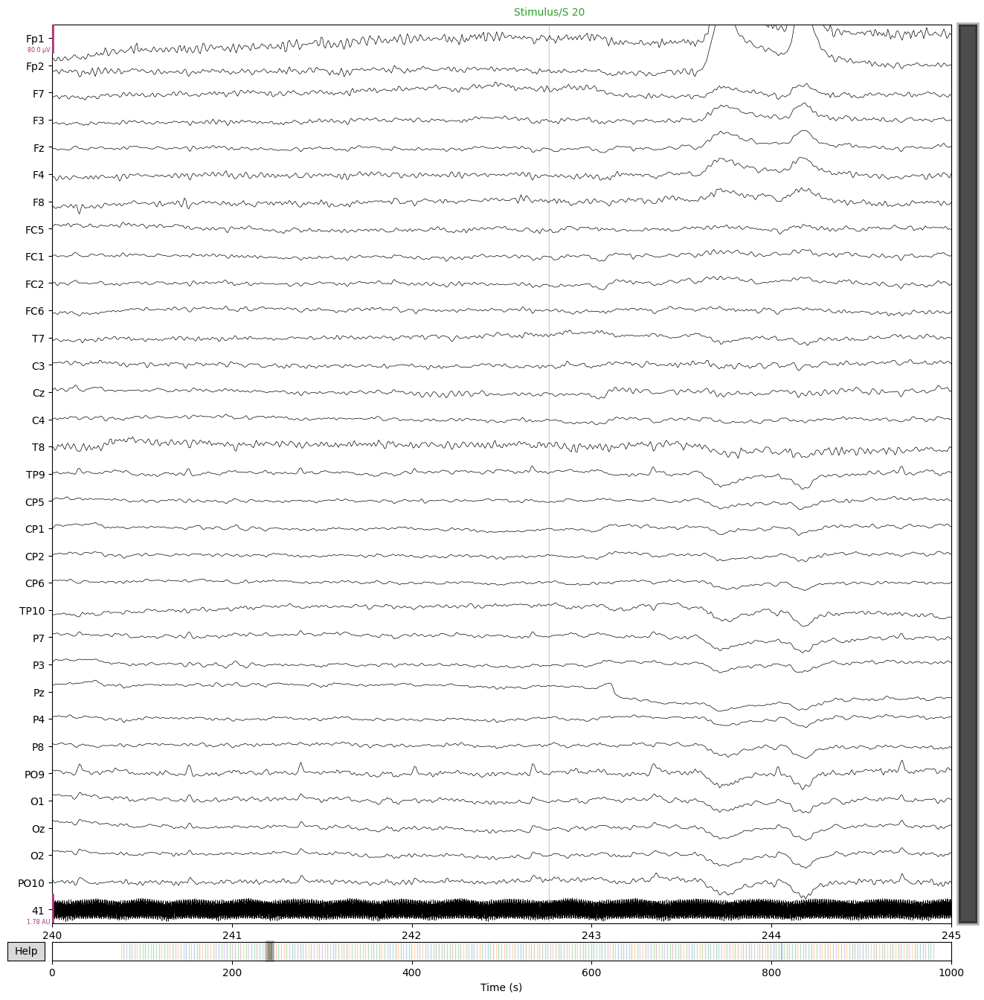

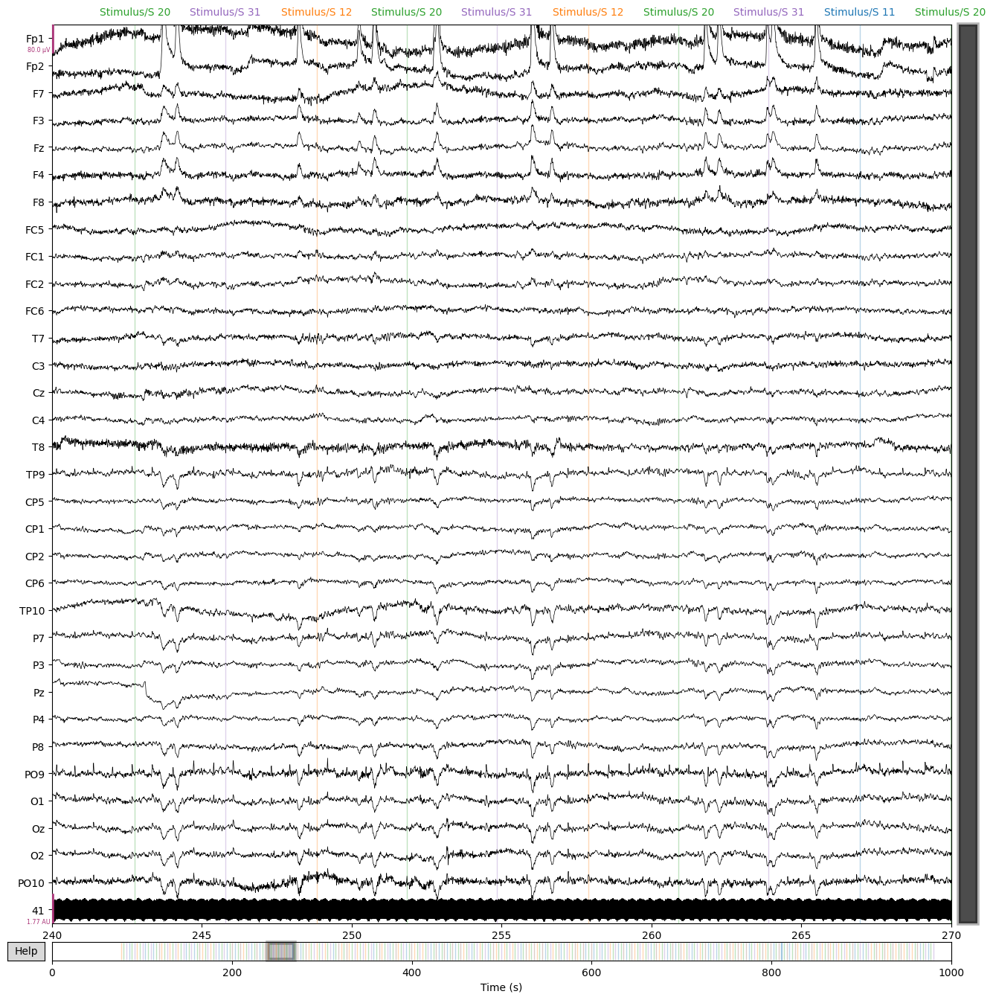

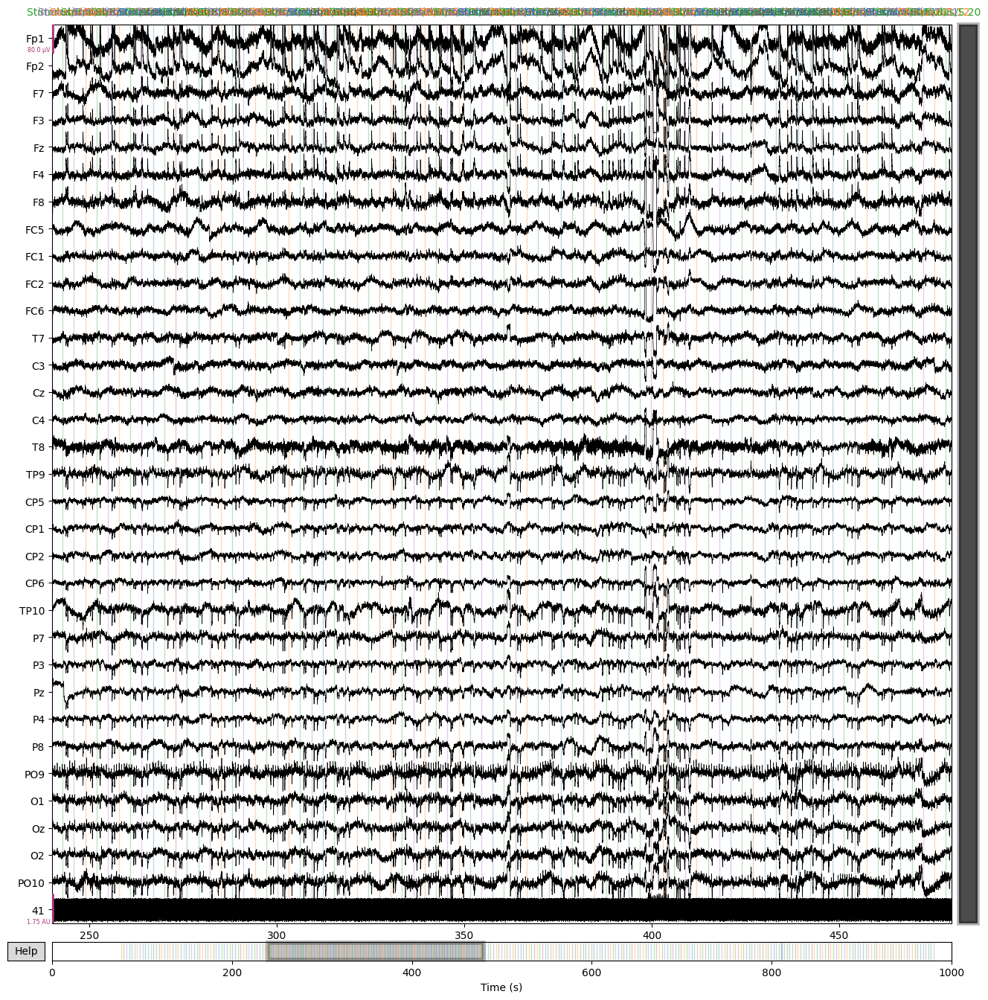

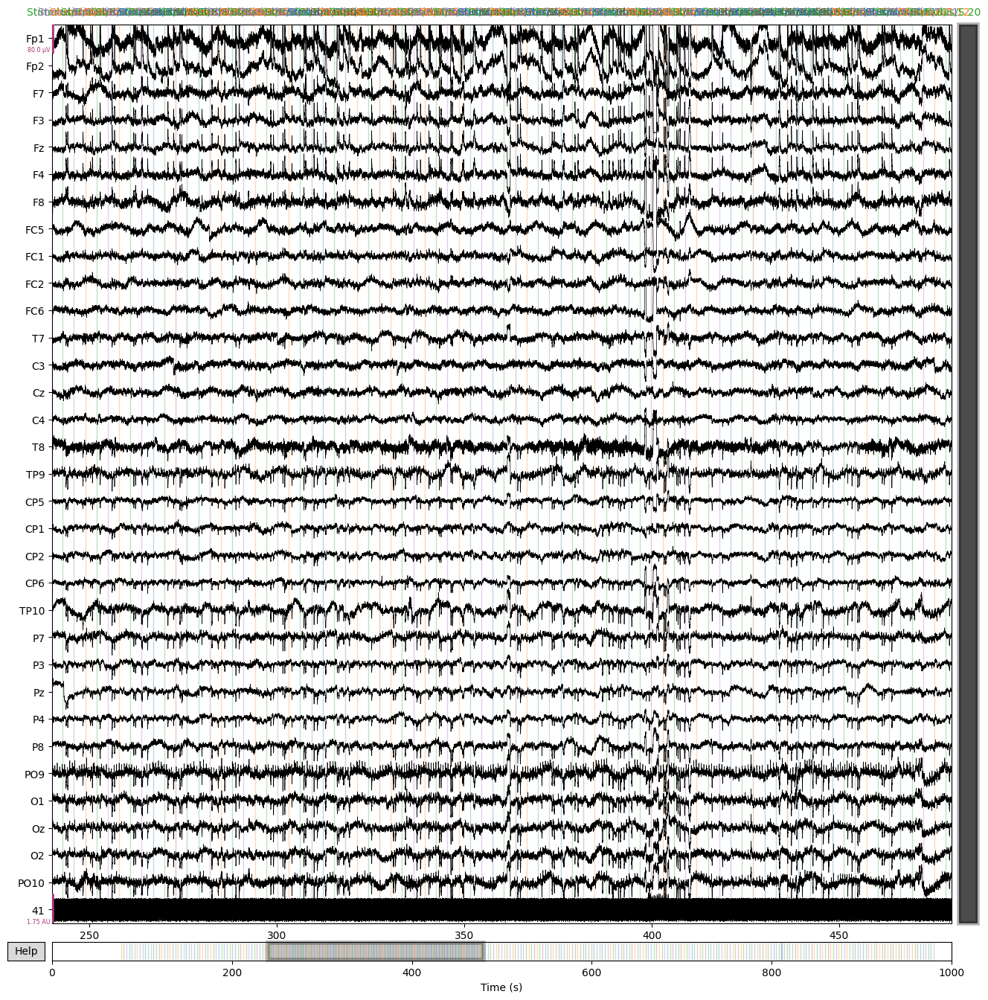

In [159]:
raw_filtered.plot(n_channels=33, scalings=scalings, title='Raw EEG Data Short', start=240, duration=5, block=True)
raw_filtered.plot(n_channels=33, scalings=scalings, title='Raw EEG Data Short', start=240, duration=30, block=True)
raw_filtered.plot(n_channels=33, scalings=scalings, title='Raw EEG Data Short', start=240, duration=240, block=True)

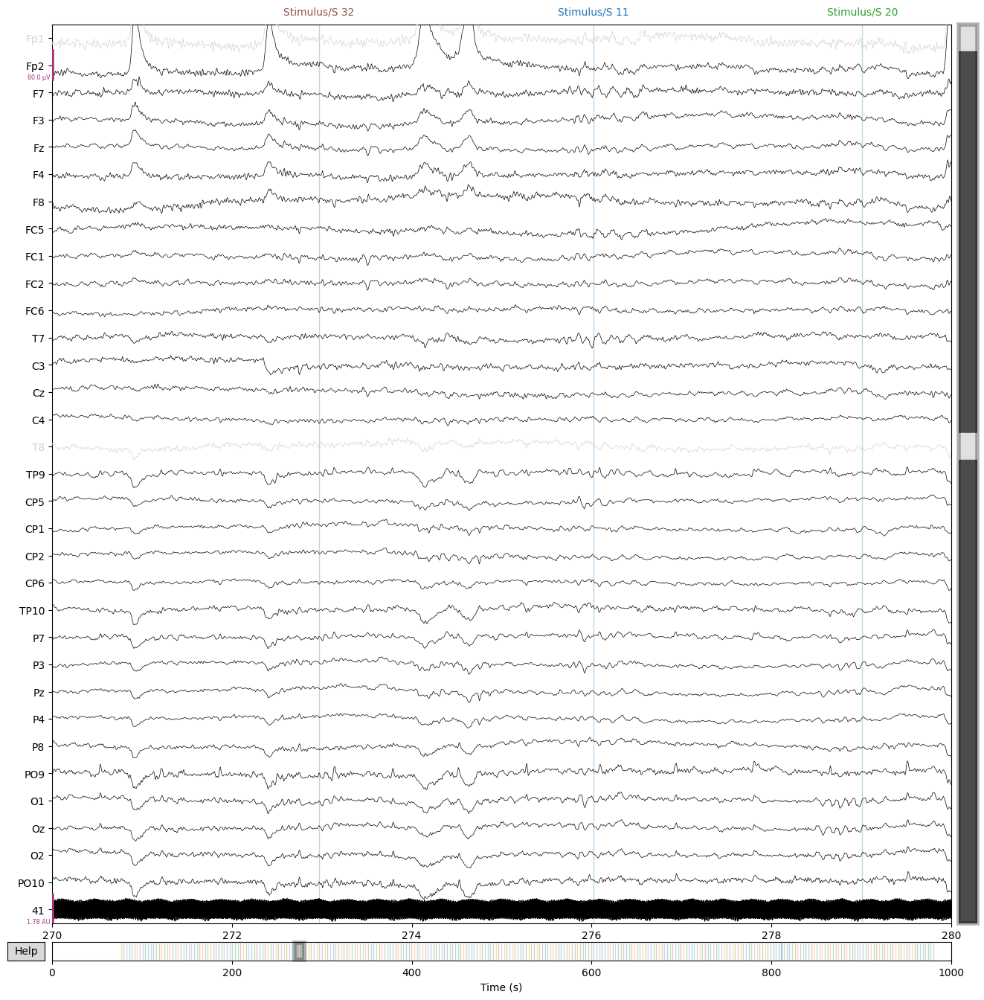

In [160]:
# remove bad channels (3)
#print(raw.info['ch_names'])
raw_filtered.info['bads'] = ['T8', "Fp1"]  
raw_filtered.plot(n_channels=33, scalings=scalings, title='Filtered EEG Data', start=270, duration=10, block=True);


In [223]:
events, event_ids = mne.events_from_annotations(raw_filtered)

Non-RawBrainVision raw using branvision markers
Used Annotations descriptions: ['Stimulus/S 11', 'Stimulus/S 12', 'Stimulus/S 20', 'Stimulus/S 31', 'Stimulus/S 32']


In [224]:
behav_data = pd.read_csv("../data_behavioral/AH_behav_raw.csv", delimiter=',')
#behav_data


In [166]:
def add_condition_column(df):
    condition = ((df['Cue'] == 'Cue 2') & (df['Category'] == 'ANIMAL')) | ((df['Cue'] == 'Cue 1') & (df['Category'] == 'TOOL'))
    # Create new condition column
    df['condition'] = 'incongruent'  # Default is incongruent
    df.loc[condition, 'condition'] = 'congruent' 
    
    return df

In [167]:
updated_behav = add_condition_column(behav_data)

In [172]:
condition = updated_behav['condition']

In [173]:
def update_values(numpy_array, pandas_series):
    if len(pandas_series) != 100:
        raise ValueError("series must have exactly 100 entries")
    
    pandas_index = 0
    
    for i in range(len(numpy_array)):
        if numpy_array[i] == 31 or numpy_array[i] == 32:
            if pandas_index < len(pandas_series):
                if pandas_series.iloc[pandas_index] == 'congruent':
                    numpy_array[i] = numpy_array[i] * 10 + 1  # Change 31 -> 311 or 32 -> 321
                elif pandas_series.iloc[pandas_index] == 'incongruent':
                    numpy_array[i] = numpy_array[i] * 10 + 2  # Change 31 -> 312  32 -> 322
                pandas_index += 1
    
    # Check if all 3x values were covered
    if pandas_index != len(pandas_series):
        raise ValueError("not all 3x values in the array have a matching series entry")
    

    return numpy_array

In [225]:
triggers = events[1:, 2]
triggers


array([20, 31, 11, 20, 31, 12, 20, 31, 11, 20, 31, 11, 20, 32, 12, 20, 31,
       12, 20, 31, 12, 20, 31, 11, 20, 31, 11, 20, 32, 12, 20, 31, 12, 20,
       31, 11, 20, 31, 11, 20, 32, 11, 20, 32, 12, 20, 31, 11, 20, 32, 11,
       20, 32, 12, 20, 31, 12, 20, 31, 12, 20, 31, 11, 20, 32, 11, 20, 32,
       12, 20, 31, 12, 20, 31, 12, 20, 31, 11, 20, 32, 12, 20, 32, 12, 20,
       31, 12, 20, 31, 12, 20, 31, 11, 20, 32, 12, 20, 31, 11, 20, 32, 12,
       20, 31, 11, 20, 32, 12, 20, 31, 12, 20, 31, 11, 20, 32, 11, 20, 32,
       11, 20, 32, 11, 20, 32, 12, 20, 31, 11, 20, 31, 12, 20, 31, 11, 20,
       32, 12, 20, 31, 12, 20, 31, 12, 20, 31, 11, 20, 32, 12, 20, 32, 12,
       20, 32, 11, 20, 31, 12, 20, 32, 11, 20, 31, 12, 20, 32, 12, 20, 32,
       11, 20, 32, 11, 20, 31, 11, 20, 31, 12, 20, 31, 11, 20, 32, 11, 20,
       32, 12, 20, 31, 12, 20, 31, 11, 20, 32, 12, 20, 31, 11, 20, 32, 11,
       20, 32, 12, 20, 31, 11, 20, 31, 12, 20, 32, 11, 20, 31, 11, 20, 31,
       12, 20, 32, 12, 20

In [226]:
updated_triggers = update_values(triggers, condition)
updated_triggers

array([ 20, 311,  11,  20, 312,  12,  20, 311,  11,  20, 312,  11,  20,
       321,  12,  20, 311,  12,  20, 311,  12,  20, 311,  11,  20, 312,
        11,  20, 321,  12,  20, 311,  12,  20, 311,  11,  20, 312,  11,
        20, 321,  11,  20, 321,  12,  20, 311,  11,  20, 321,  11,  20,
       321,  12,  20, 311,  12,  20, 311,  12,  20, 311,  11,  20, 321,
        11,  20, 321,  12,  20, 311,  12,  20, 311,  12,  20, 311,  11,
        20, 321,  12,  20, 322,  12,  20, 311,  12,  20, 311,  12,  20,
       311,  11,  20, 321,  12,  20, 311,  11,  20, 321,  12,  20, 311,
        11,  20, 321,  12,  20, 311,  12,  20, 311,  11,  20, 321,  11,
        20, 321,  11,  20, 321,  11,  20, 321,  12,  20, 311,  11,  20,
       312,  12,  20, 311,  11,  20, 321,  12,  20, 311,  12,  20, 311,
        12,  20, 311,  11,  20, 321,  12,  20, 322,  12,  20, 322,  11,
        20, 312,  12,  20, 322,  11,  20, 312,  12,  20, 322,  12,  20,
       322,  11,  20, 321,  11,  20, 312,  11,  20, 312,  12,  2

In [217]:
first_event_sample = events[1, 0]
first_event_time = first_event_sample / raw.info['sfreq']

last_event_sample = events[-1, 0]
last_event_time = last_event_sample / raw.info['sfreq']

new_start_time = max(first_event_time - 1.5, 0)
new_end_time = min(last_event_time + 0.8, raw.times[-1])


raw_cropped = raw_filtered.copy().crop(tmin=75, tmax=982)



8078.047
1000.0


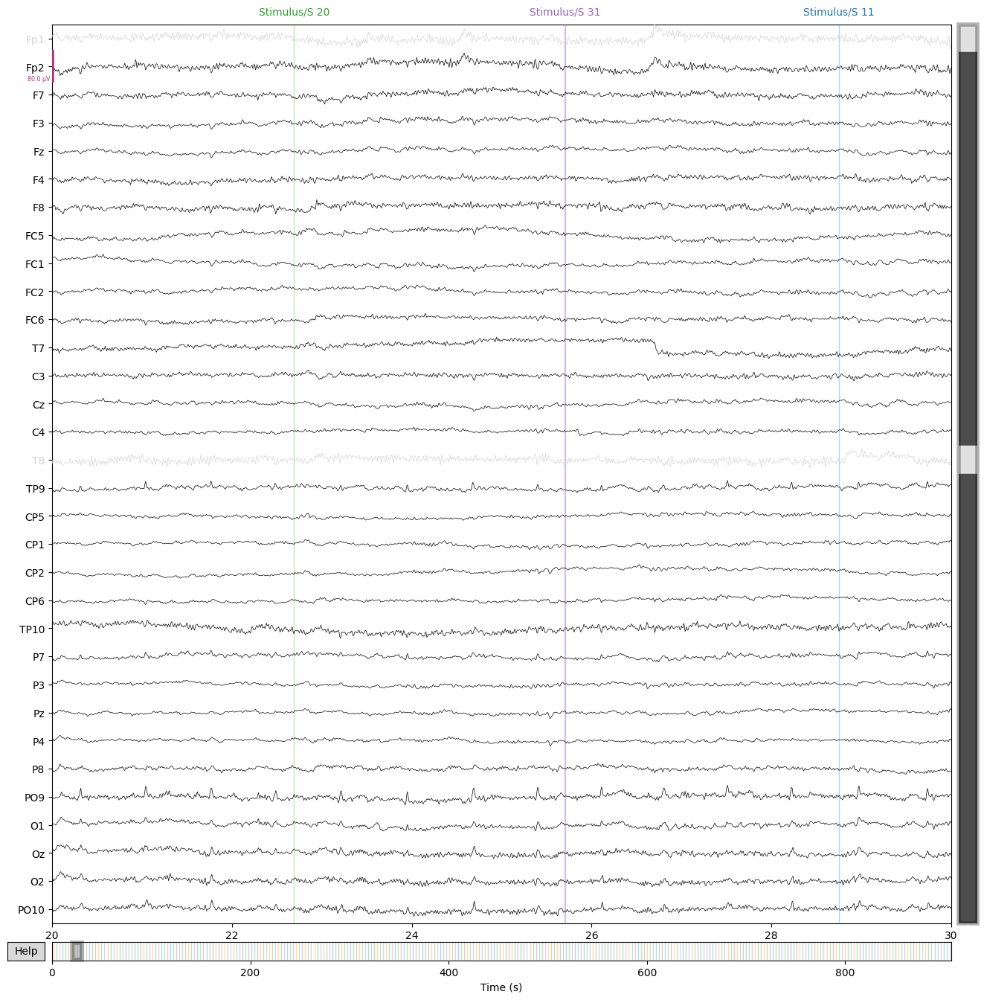

In [234]:
raw_cropped.plot(n_channels=33, scalings=scalings, title='Filtered EEG Data', start=20, duration=10, block=True);

In [228]:
import sklearn
raw_cropped.pick(['eeg', 'stim'])
ica = mne.preprocessing.ICA(n_components=0.95, random_state=7, max_iter=800)
ica.fit(raw_cropped)

Fitting ICA to data using 30 channels (please be patient, this may take a while)
Selecting by explained variance: 13 components
Fitting ICA took 12.7s.


Method,fastica
Fit parameters,algorithm=parallelfun=logcoshfun_args=Nonemax_iter=800
Fit,25 iterations on raw data (907001 samples)
ICA components,13
Available PCA components,30
Channel types,eeg
ICA components marked for exclusion,—


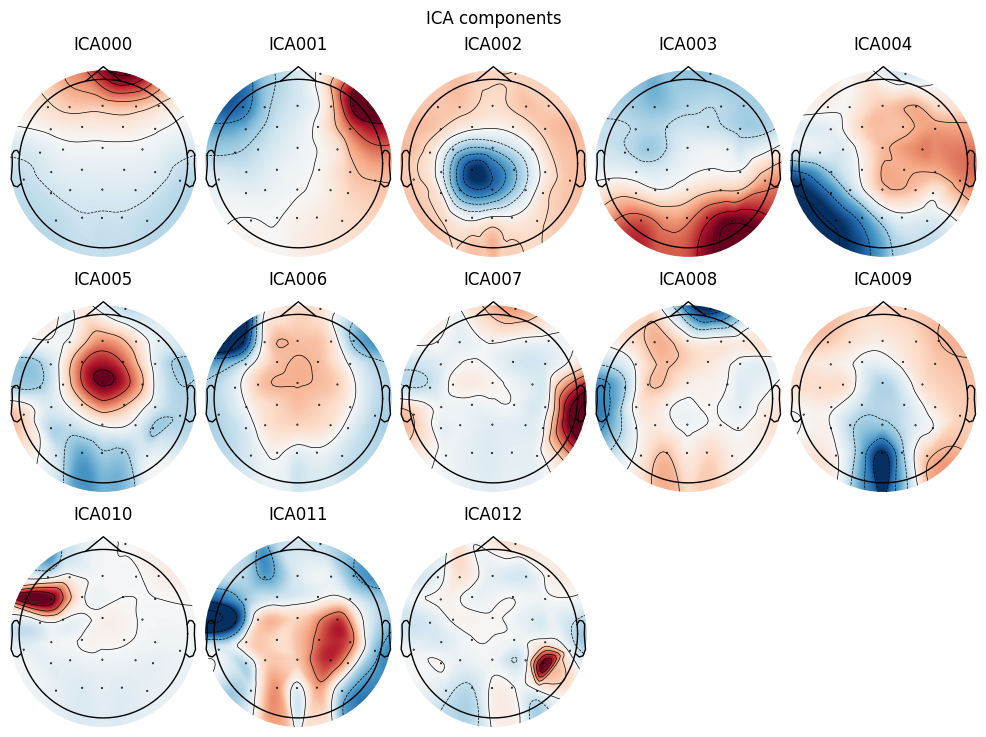

In [229]:
ica.plot_components();

Creating RawArray with float64 data, n_channels=13, n_times=907001
    Range : 8075000 ... 8982000 =   8075.000 ...  8982.000 secs
Ready.


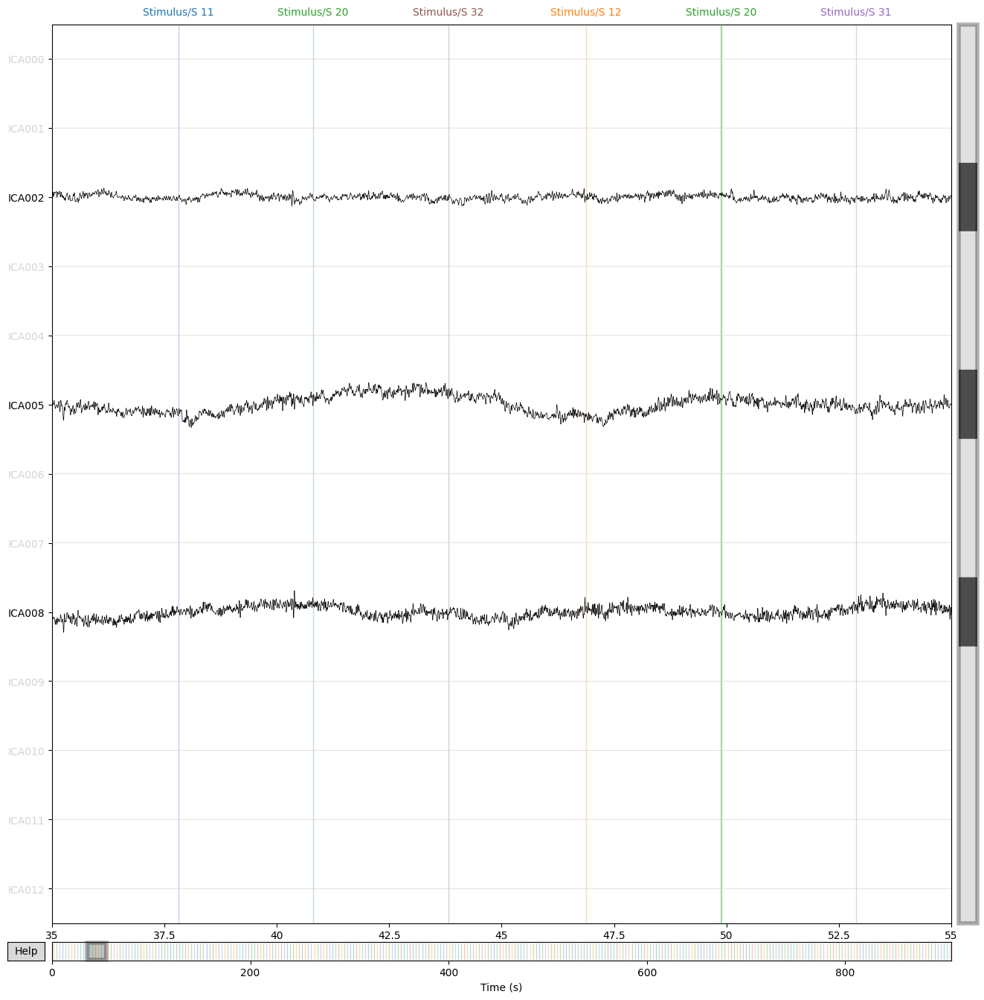

In [267]:
ica.plot_sources(raw_cropped, start = 35);

In [265]:
ica.exclude = [0,1,3,4,6,7,9,10,11,12]
ica.apply(raw_cropped)

Applying ICA to Raw instance


    Transforming to ICA space (13 components)
    Zeroing out 10 ICA components
    Projecting back using 30 PCA components


Measurement date,"May 02, 2024 09:55:09 GMT"
Experimenter,Unknown
Participant,Unknown
Digitized points,35 points
Good channels,30 EEG
Bad channels,"T8, Fp1"
EOG channels,Not available
ECG channels,Not available
Sampling frequency,1000.00 Hz
Highpass,0.10 Hz
Lowpass,40.00 Hz


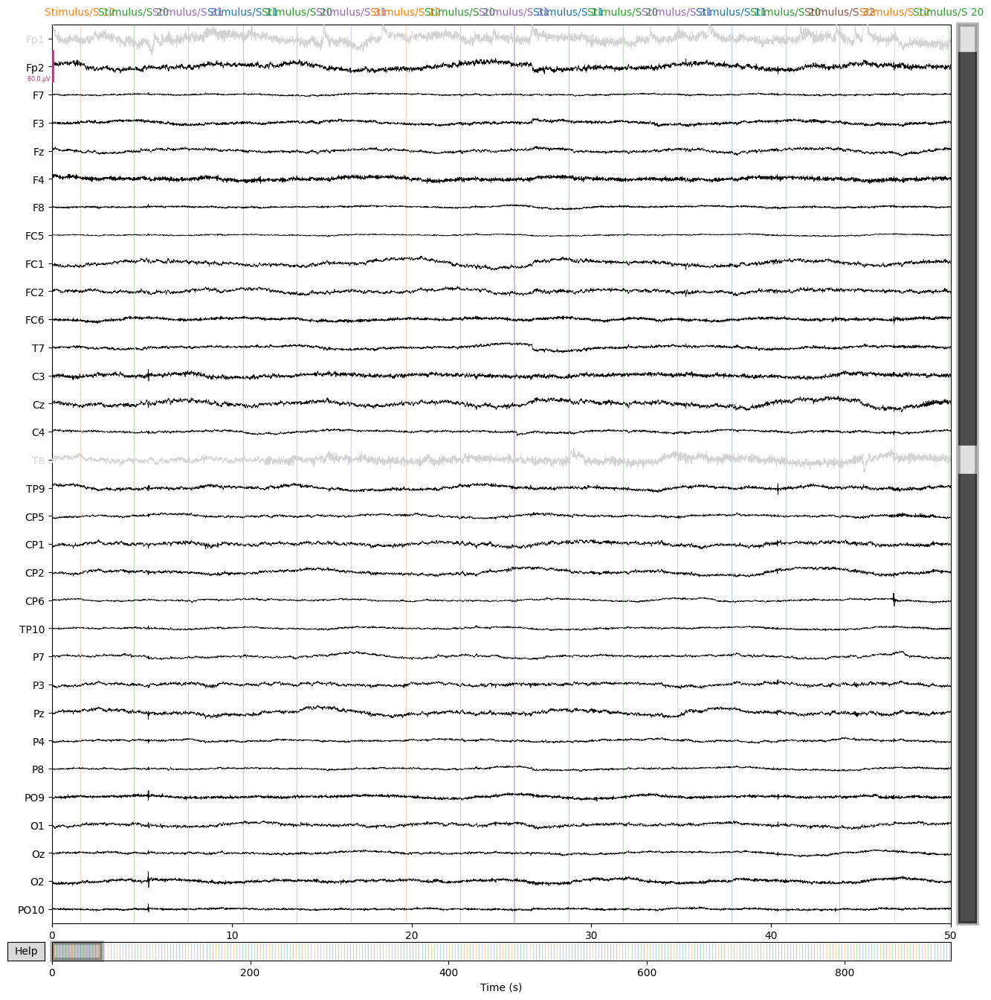

In [270]:
raw = raw_cropped
raw.plot(n_channels=33, scalings=scalings, title='Filtered EEG Data', start=0, duration=50, block=True);


In [282]:
#events = events[events[:, 2] != 99999]
events[:,2]
#updated_behav

array([ 12,  21, 311,  11,  20, 312,  12,  21, 311,  11,  20, 312,  11,
        21, 321,  12,  21, 311,  12,  21, 311,  12,  21, 311,  11,  20,
       312,  11,  21, 321,  12,  21, 311,  12,  21, 311,  11,  20, 312,
        11,  21, 321,  11,  21, 321,  12,  21, 311,  11,  21, 321,  11,
        21, 321,  12,  21, 311,  12,  21, 311,  12,  21, 311,  11,  21,
       321,  11,  21, 321,  12,  21, 311,  12,  21, 311,  12,  21, 311,
        11,  21, 321,  12,  20, 322,  12,  21, 311,  12,  21, 311,  12,
        21, 311,  11,  21, 321,  12,  21, 311,  11,  21, 321,  12,  21,
       311,  11,  21, 321,  12,  21, 311,  12,  21, 311,  11,  21, 321,
        11,  21, 321,  11,  21, 321,  11,  21, 321,  12,  21, 311,  11,
        20, 312,  12,  21, 311,  11,  21, 321,  12,  21, 311,  12,  21,
       311,  12,  21, 311,  11,  21, 321,  12,  20, 322,  12,  20, 322,
        11,  20, 312,  12,  20, 322,  11,  20, 312,  12,  21, 322,  12,
        21, 322,  11,  21, 321,  11,  21, 312,  11,  21, 312,  1

In [274]:
def is_prediction_correct(row):
    prediction_category = 'ANIMAL' if row['Prediction'] == 0 else 'TOOL'
    cue_category = 'TOOL' if row['Cue'] == 'Cue 1' else 'ANIMAL'
    
    return int(prediction_category == row['Category'] or cue_category == row['Category'])

updated_behav['Correct'] = updated_behav.apply(is_prediction_correct, axis=1)


In [280]:
#############################################
# add correct/incorrect responses to triggers
#############################################
trigger_idx = 0

for index, row in updated_behav.iterrows():
    while trigger_idx < len(updated_triggers) and updated_triggers[trigger_idx] != 20:
        trigger_idx += 1
    
    if trigger_idx >= len(updated_triggers):
        break
    
    # Update the value based on the Correct column
    updated_triggers[trigger_idx] = 21 if row['Correct'] == 1 else 20
    
    # Move to the next trigger
    trigger_idx += 1

In [284]:
updated_triggers
#events[:, 2] = updated_triggers
#events

array([ 21, 311,  11,  20, 312,  12,  21, 311,  11,  20, 312,  11,  21,
       321,  12,  21, 311,  12,  21, 311,  12,  21, 311,  11,  20, 312,
        11,  21, 321,  12,  21, 311,  12,  21, 311,  11,  20, 312,  11,
        21, 321,  11,  21, 321,  12,  21, 311,  11,  21, 321,  11,  21,
       321,  12,  21, 311,  12,  21, 311,  12,  21, 311,  11,  21, 321,
        11,  21, 321,  12,  21, 311,  12,  21, 311,  12,  21, 311,  11,
        21, 321,  12,  20, 322,  12,  21, 311,  12,  21, 311,  12,  21,
       311,  11,  21, 321,  12,  21, 311,  11,  21, 321,  12,  21, 311,
        11,  21, 321,  12,  21, 311,  12,  21, 311,  11,  21, 321,  11,
        21, 321,  11,  21, 321,  11,  21, 321,  12,  21, 311,  11,  20,
       312,  12,  21, 311,  11,  21, 321,  12,  21, 311,  12,  21, 311,
        12,  21, 311,  11,  21, 321,  12,  20, 322,  12,  20, 322,  11,
        20, 312,  12,  20, 322,  11,  20, 312,  12,  21, 322,  12,  21,
       322,  11,  21, 321,  11,  21, 312,  11,  21, 312,  12,  2

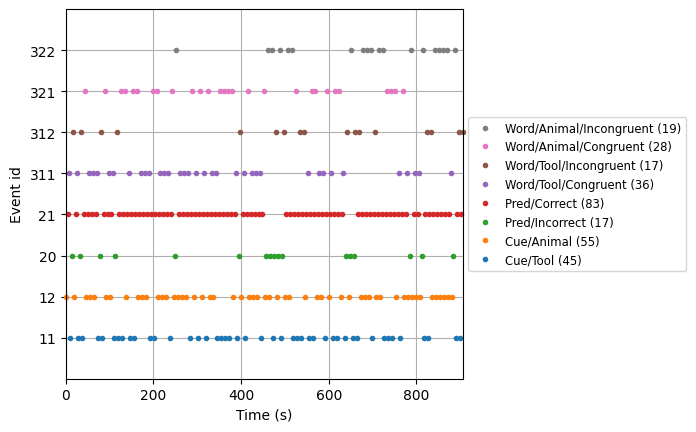

C:\Users\Samuel\AppData\Local\Temp\ipykernel_5800\1217292813.py:15: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


In [285]:

# setup dict
event_id = {'Cue/Tool': 11, 
 'Cue/Animal': 12, 
 'Pred/Incorrect': 20, 
 'Pred/Correct': 21, 
 'Word/Tool/Congruent': 311, 
 'Word/Animal/Incongruent': 322,
 'Word/Animal/Congruent': 321, 
 'Word/Tool/Incongruent': 312, 
 }

fig = mne.viz.plot_events(events, event_id=event_id, sfreq=raw.info['sfreq'], first_samp=raw.first_samp)

# Show the plot
fig.show()


## Epoching

In [286]:
reject = {'eeg': 150e-6}
picks = ['eeg']
tmin, tmax = -0.2, 0.7
epochs = mne.Epochs(
    raw, 
    events = events, 
    event_id = event_id, 
    tmin = tmin, 
    tmax = tmax, 
    picks = picks, 
    baseline = (tmin, 0), 
    reject = reject, 
    preload = True
    )

Not setting metadata
300 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 300 events and 901 original time points ...


0 bad epochs dropped


In [287]:
import matplotlib
%matplotlib qt
print(matplotlib.get_backend())

QtAgg


Dropped 6 epochs: 15, 25, 55, 107, 150, 283
The following epochs were marked as bad and are dropped:
[15, 25, 55, 107, 150, 283]
Channels marked as bad:
['T8', 'Fp1']


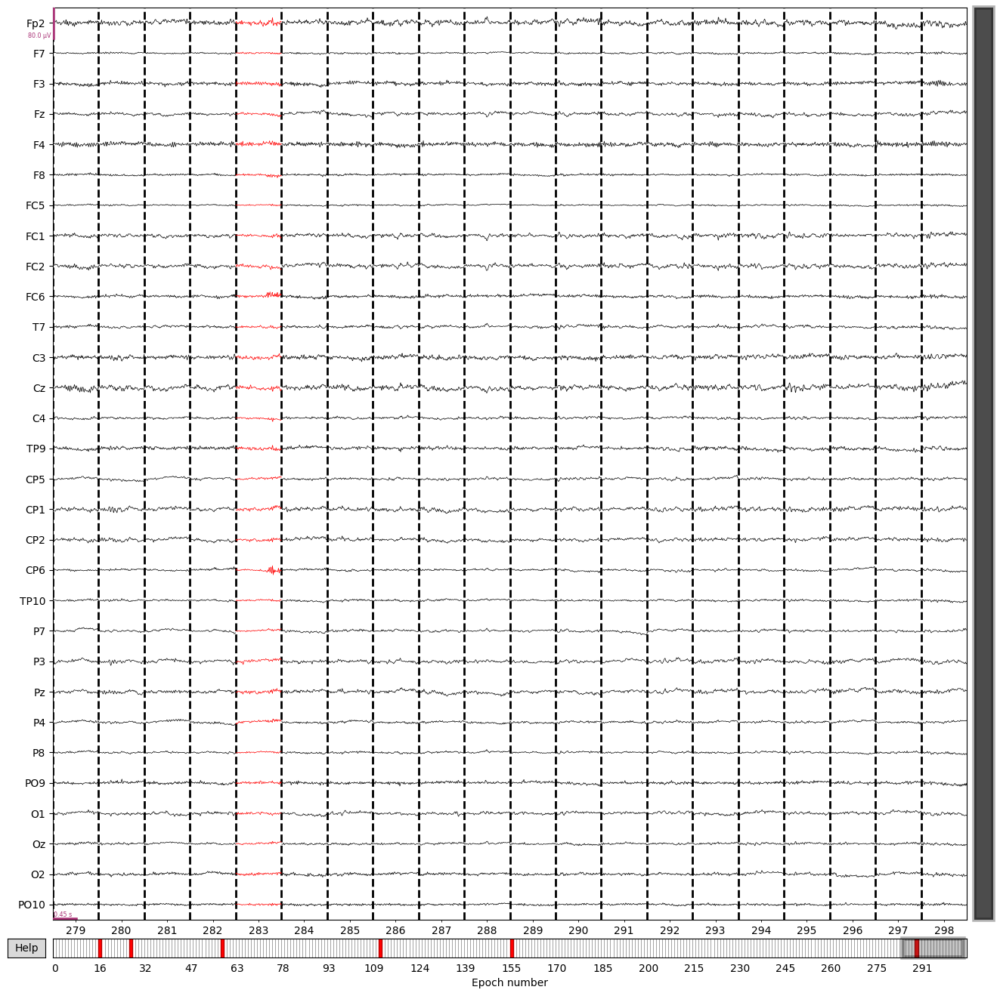

In [288]:
epochs.plot(block=True, n_channels=33, scalings=scalings)
# Epochs Dropped: first participant 0, 38, 91, 128, 135, 226
# Epochs Dropepd: second participant 15, 25, 55, 107, 150, 283

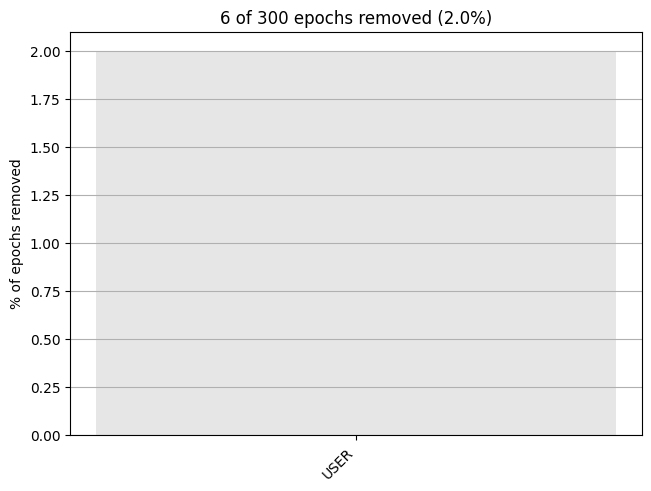

In [289]:
epochs.plot_drop_log()

In [291]:
updated_behav

,Trial,Cue,Category,Prob_cat,CueOnset,CueOffset,Prediction,ReactionTime,PredOnset,PredOffset,WordOnset,WordOffset,condition,Correct
0,1,Cue 1,TOOL,Congruent,45.411930,46.928144,NaN,NaN,48.431738,49.944963,51.446575,52.945347,congruent,1
1,2,Cue 2,TOOL,Congruent,54.446631,55.995403,0.0,58.028663,57.507807,59.011836,60.514504,62.013073,incongruent,0
2,3,Cue 1,TOOL,Congruent,63.514395,65.063142,1.0,67.112546,66.575493,68.079149,69.581167,71.079919,congruent,1
3,4,Cue 2,TOOL,Congruent,72.581179,74.129970,0.0,76.166894,75.642416,77.145822,78.647973,80.146673,incongruent,0
4,5,Cue 2,ANIMAL,Congruent,81.647834,83.180138,0.0,85.262997,84.692545,86.196151,87.698212,89.196922,congruent,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,96,Cue 1,ANIMAL,Incongruent,906.780199,908.328940,0.0,910.265779,909.841309,911.344965,912.846935,914.345726,incongruent,1
96,97,Cue 1,TOOL,Incongruent,915.847149,917.395777,0.0,919.411784,918.908006,920.412249,921.913784,923.412572,congruent,1
97,98,Cue 1,ANIMAL,Incongruent,924.913839,926.462606,1.0,928.628617,927.974940,929.495071,930.997277,932.496051,incongruent,0
98,99,Cue 2,TOOL,Incongruent,933.997465,935.546116,1.0,937.478813,937.058401,938.561966,940.064092,941.562911,incongruent,1


In [293]:
epochs.save('../data_EEG/2_filtered_epochs-epo.fif', overwrite=True)
raw.save('../data_EEG/2_cleaned_raw.fif', overwrite=True)
updated_behav.to_csv('../data_behavioral/2_updated_behav.csv', index=False)
